In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
%matplotlib inline

from sklearn.metrics import classification_report

import tensorflow as tf

In [2]:
## read in images with a imagedatagenerator 

# Create a list with the filepaths for training and testing
img_Path = "/kaggle/input/corn-leaf-infection-dataset/Corn Disease detection"
##
from tensorflow.keras.preprocessing.image import ImageDataGenerator
datagen = ImageDataGenerator(
        rescale=1./255, validation_split = 0.25)
##
train_generator = datagen.flow_from_directory(
        img_Path,
        target_size=(224, 224),
        batch_size=32,
        class_mode = 'binary',
        shuffle = 'False',
        seed = 123,
    
    subset = 'training'
        )
valid_generator = datagen.flow_from_directory(
        img_Path,
        target_size=(224, 224),
        batch_size=32,
        class_mode = 'binary',
        shuffle = 'False',
        seed = 123,
        
    subset = 'validation'
        )
test_img_path = "../input/test-dataset-2/corn_leaf_images"
test_datagen = ImageDataGenerator(
        rescale=1./255)
test_generator = test_datagen.flow_from_directory(
        test_img_path,
        target_size=(224, 224),
        batch_size=32,
        class_mode = 'binary',
        shuffle = 'False',
    
        )

Found 3169 images belonging to 2 classes.
Found 1056 images belonging to 2 classes.
Found 34 images belonging to 2 classes.


In [3]:
dict_classes = train_generator.class_indices
dict_classes

{'Healthy corn': 0, 'Infected': 1}

In [4]:
def get_class(val, dictionary):
    for key,values in dictionary.items():
        if val == values:
            return key
    return
        

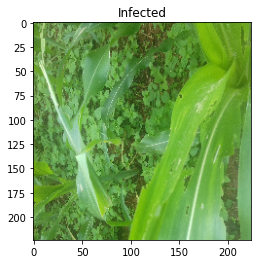

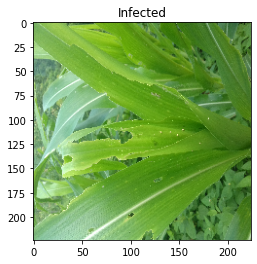

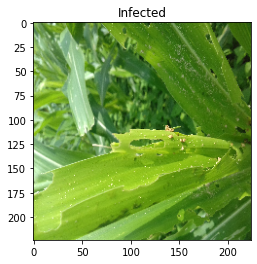

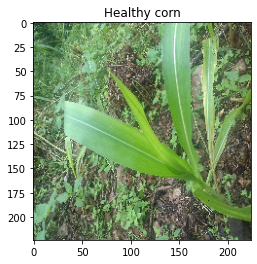

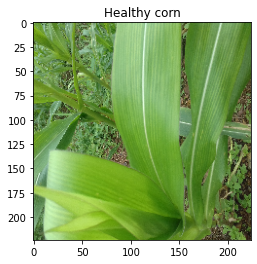

...

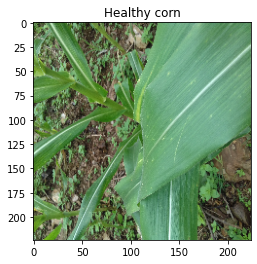

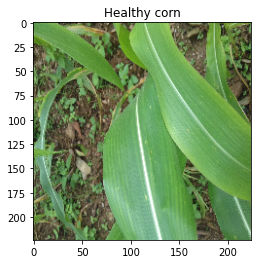

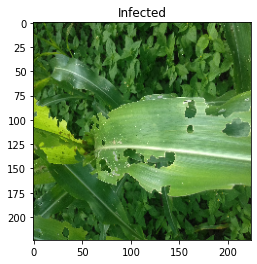

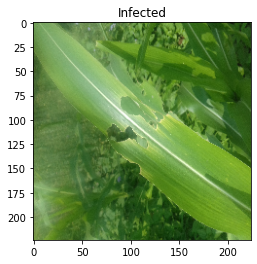

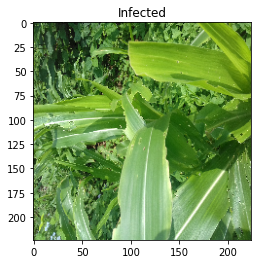

In [5]:
## visualize some training images
#x= train_generator.next()
images, labels = next(train_generator)
for i in range(0,17):
    image = images[i]
    name = get_class(labels[i], dict_classes)
    plt.imshow(image)
    plt.title(name)
    plt.show()

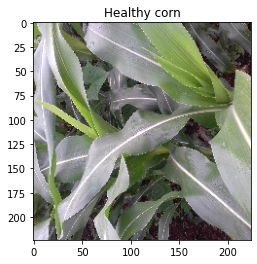

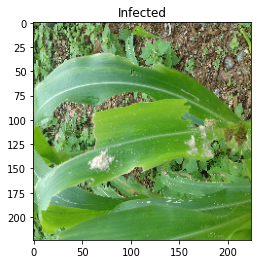

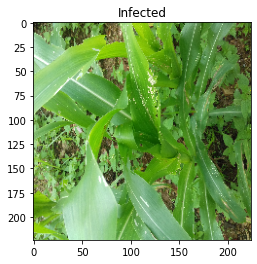

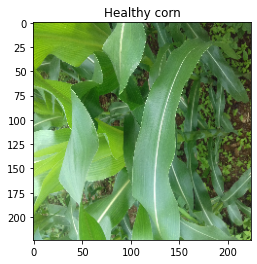

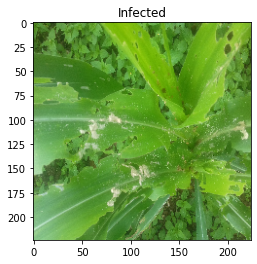

...

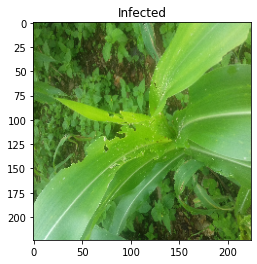

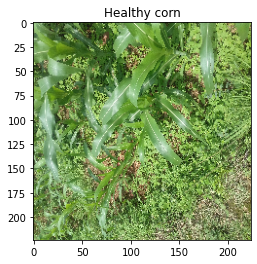

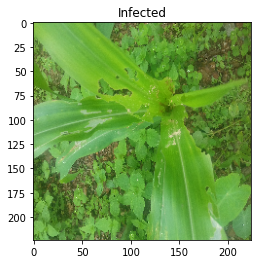

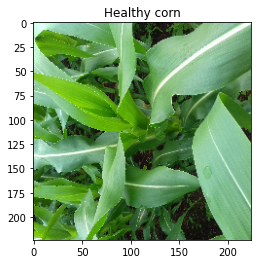

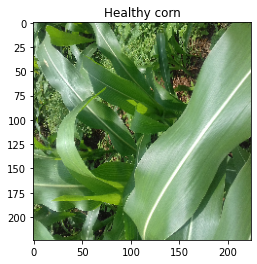

In [6]:
## visualize validation image dataset.  
valid_images, valid_labels = next(valid_generator)
for i in range(0,17):
    image = valid_images[i]
    name = get_class(valid_labels[i], dict_classes)
    plt.imshow(image)
    plt.title(name)
    plt.show()

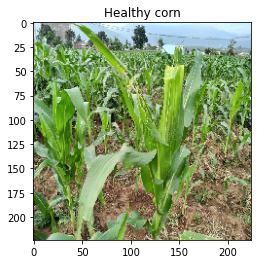

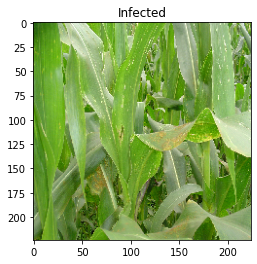

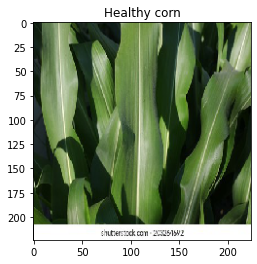

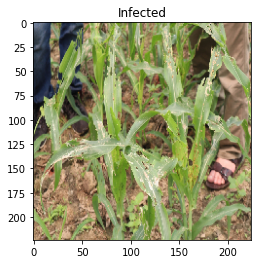

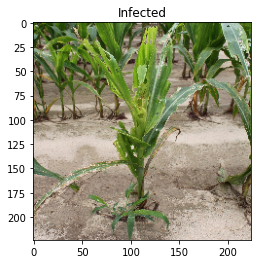

...

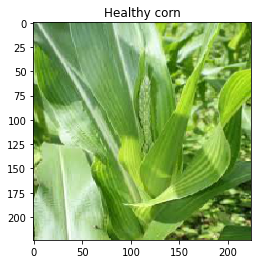

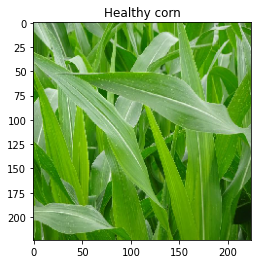

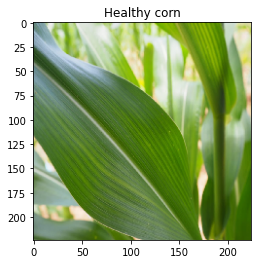

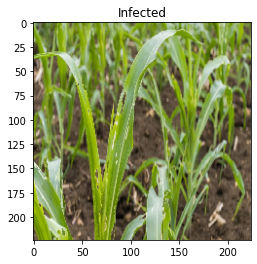

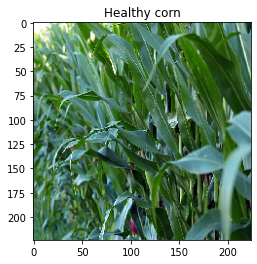

In [7]:
## visualize test image dataset.  
test_images, test_labels = next(test_generator)
for i in range(0,17):
    image = test_images[i]
    name = get_class(test_labels[i], dict_classes)
    plt.imshow(image)
    plt.title(name)
    plt.show()

In [8]:
pd.Series(train_generator.labels).value_counts()

1    1669
0    1500
dtype: int64

In [9]:
pd.Series(valid_generator.labels).value_counts()

1    556
0    500
dtype: int64

Train and validation image dataset seem to have balanced classes.

Epoch 1/10
100/100 [==============================] - 1016s 10s/step - loss: 0.9219 - accuracy: 0.5448 - val_loss: 0.3593 - val_accuracy: 0.8532
Epoch 2/10
100/100 [==============================] - 967s 10s/step - loss: 0.4185 - accuracy: 0.8198 - val_loss: 0.2856 - val_accuracy: 0.8883
Epoch 3/10
100/100 [==============================] - 1005s 10s/step - loss: 0.2264 - accuracy: 0.9075 - val_loss: 0.3822 - val_accuracy: 0.8475
Epoch 4/10
100/100 [==============================] - 973s 10s/step - loss: 0.1317 - accuracy: 0.9485 - val_loss: 0.4328 - val_accuracy: 0.8608
Epoch 6/10
100/100 [==============================] - 988s 10s/step - loss: 0.1578 - accuracy: 0.9479 - val_loss: 0.7298 - val_accuracy: 0.8191
Epoch 8/10
100/100 [==============================] - 987s 10s/step - loss: 0.0915 - accuracy: 0.9666 - val_loss: 0.6044 - val_accuracy: 0.8400
Epoch 9/10
100/100 [==============================] - 980s 10s/step - loss: 0.0518 - accuracy: 0.9855 - val_loss: 0.8564 - val_accurac

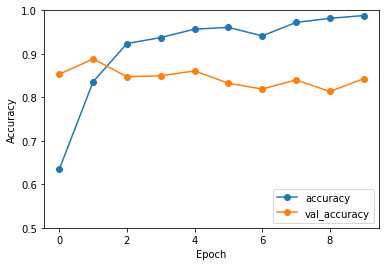

In [10]:
## increase the convolution + maxpooling layer to 3 

##
model = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D( activation='relu', input_shape=(224, 224, 3), filters = 64, kernel_size = 3),
    tf.keras.layers.MaxPooling2D(pool_size = (2,2), strides = (2, 2)),
    tf.keras.layers.Conv2D( activation='relu',  filters = 64, kernel_size = 3),
    tf.keras.layers.MaxPooling2D(pool_size = (2,2), strides = (2, 2)),
    tf.keras.layers.Conv2D( activation='relu',  filters = 64, kernel_size = 3),
    tf.keras.layers.MaxPooling2D(pool_size = (2,2), strides = (2, 2)),
    tf.keras.layers.Dropout(0.2),
tf.keras.layers.Flatten(),
tf.keras.layers.Dense(128, activation=tf.nn.relu),
tf.keras.layers.Dense(2, activation=tf.nn.softmax)])


model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'], )
%time history = model.fit(train_generator, epochs=10, validation_data = valid_generator)
##
test_loss, test_acc = model.evaluate(test_generator)
print("Test image accuracy :{}".format(test_acc))
##
plt.plot(history.history['accuracy'], '-o' ,label='accuracy')
plt.plot(history.history['val_accuracy'], '-o', label = 'val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.ylim([0.5, 1])
plt.legend(loc='lower right')
##
model.save('model_cnn2')
##
predictions = model.predict(test_generator)
##
y_pred = np.argmax(predictions, axis=1)
print('Classification Report')
target_names = ['Healthy corn', 'Infected']
print(classification_report(test_generator.classes, y_pred, target_names=target_names))

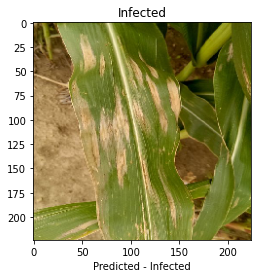

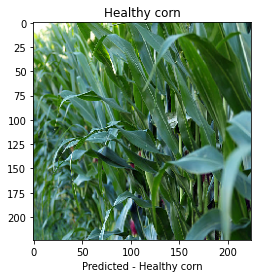

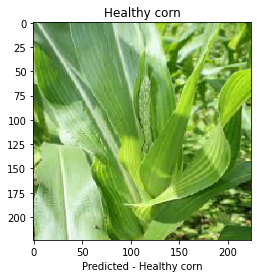

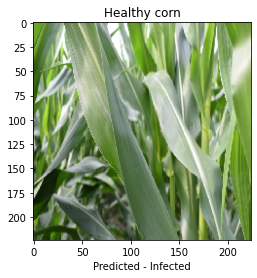

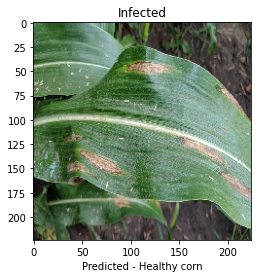

...

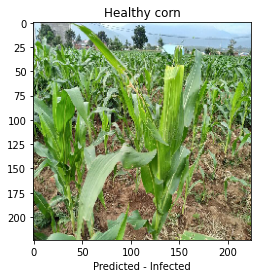

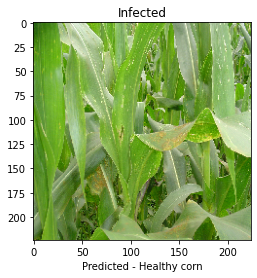

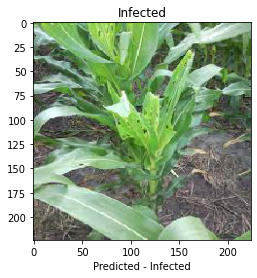

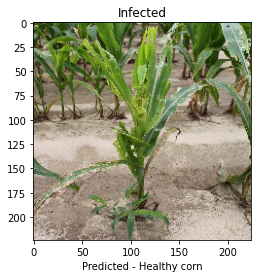

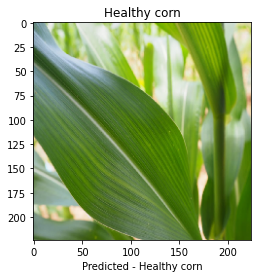

In [13]:
## visualize the test data set images with predicted labels 
## visualize test image dataset.  
test_images, test_labels = next(test_generator)
for i in range(len(test_labels)):
    image = test_images[i]
    name = get_class(test_labels[i], dict_classes)
    pred_name = get_class(y_pred[i], dict_classes)
    plt.imshow(image)
    plt.title(name)
    plt.xlabel("Predicted - " + pred_name)
    plt.show()

Accuracy of the model in identifying the  Infected corn is very poor.